# Chirundu Town Council CDF Proposed Community Projects - 2023

## Purpose

This notebook extracts, cleans, validates and exports CDF proposed
community project information published by Chirundu Town Council for
2023.

The source consists of scanned PDF pages. OCR is used to assist with
text extraction, followed by manual verification against the original
source tables.

All useful source fields are preserved, while additional fields needed
for analysis are created during preprocessing.

In [1]:
import os
import pymupdf
import pytesseract
import pandas as pd
import cv2
import numpy as np

from PIL import Image
from IPython.display import display

pytesseract.pytesseract.tesseract_cmd = (
    r"C:\Program Files\Tesseract-OCR\tesseract.exe"
)

print("Libraries loaded successfully.")
print("Tesseract version:", pytesseract.get_tesseract_version())

Libraries loaded successfully.
Tesseract version: 5.4.0.20240606


## Source Document

The source document is titled **2023 CDF Proposed Projects Chirundu**.

The source table contains:

- No.
- Name of Project
- Project Description
- Sector
- Type
- Ward
- Amount Applied

The document contains two scanned pages and therefore requires OCR and
manual verification for reliable extraction.

In [2]:
pdf_path = "raw/2023-CDF-Proposed-Community-Projects.pdf"

print("File exists:", os.path.exists(pdf_path))

File exists: True


In [3]:
doc = pymupdf.open(pdf_path)

print("PDF opened successfully.")
print("Number of pages:", len(doc))

PDF opened successfully.
Number of pages: 2


## Direct Text Extraction Test

Direct text extraction is attempted first.

Because the source consists primarily of scanned table images, OCR is
used when sufficient machine-readable text cannot be obtained.

In [4]:
for page_number, page in enumerate(doc):
    text = page.get_text().strip()

    print(
        f"Page {page_number + 1}:",
        len(text),
        "characters detected"
    )

Page 1: 10 characters detected
Page 2: 10 characters detected


## OCR Processing

Each scanned PDF page is rendered as a high-resolution image.

The rendered pages are then processed using Tesseract OCR to assist
with extraction. The OCR results are subsequently compared with the
original scanned tables before the final dataset is created.

In [5]:
os.makedirs(
    "notebooks/2023_proposed_ocr",
    exist_ok=True
)

image_paths = []

for i, page in enumerate(doc):

    matrix = pymupdf.Matrix(3, 3)

    pix = page.get_pixmap(
        matrix=matrix,
        alpha=False
    )

    image_path = (
        f"notebooks/2023_proposed_ocr/"
        f"2023_proposed_page{i + 1}.png"
    )

    pix.save(image_path)
    image_paths.append(image_path)

    print("Saved:", image_path)

Saved: notebooks/2023_proposed_ocr/2023_proposed_page1.png
Saved: notebooks/2023_proposed_ocr/2023_proposed_page2.png



PAGE 1


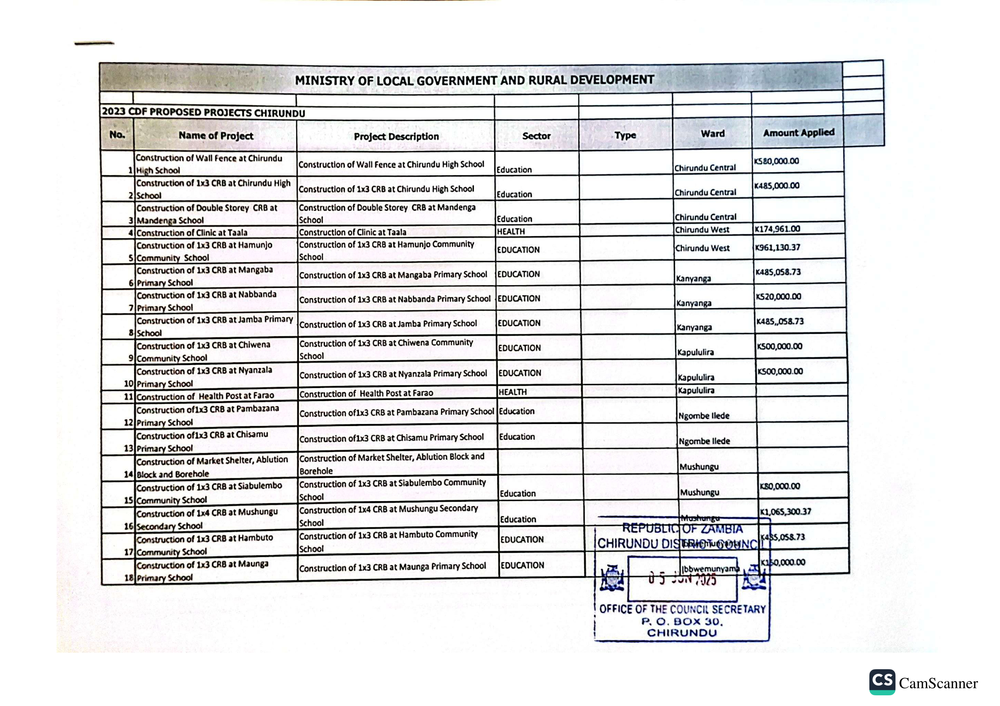


PAGE 2


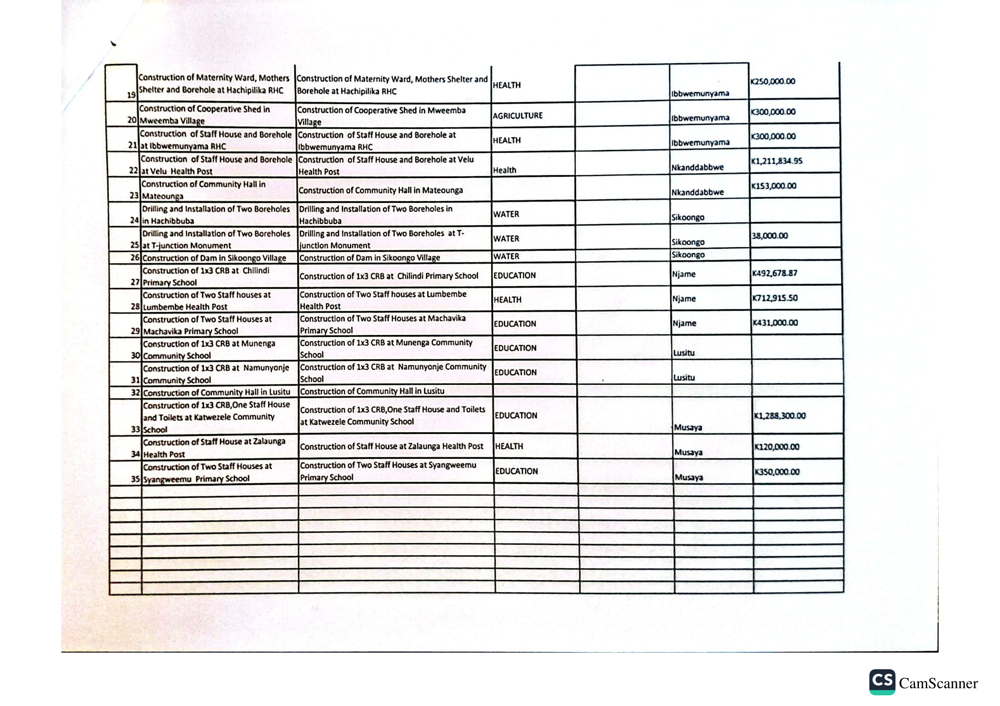

In [6]:
for i, image_path in enumerate(image_paths):

    print(f"\nPAGE {i + 1}")

    page_image = Image.open(image_path)

    display(page_image)

In [7]:
ocr_pages_2023 = []

for i, image_path in enumerate(image_paths):

    image = cv2.imread(image_path)

    gray = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2GRAY
    )

    text = pytesseract.image_to_string(
        gray,
        lang="eng",
        config="--psm 6"
    )

    ocr_pages_2023.append(text)

    print(
        f"\n========== PAGE {i + 1} ==========\n"
    )

    print(text)


========== PAGE 1 ==========

———.
ee ee ‘ polis
ree . Ls ae) ) MINISTRY OF LOCAL GOVERNMENT AND RURAL DEVELOPMENT BS Fria, - [| —
2023 CDF PROPOSED PROJECTS CHIRUNDU Oe
| arin ee tiring ret ee eee
Fees of Wall Fence at Chirundu Construction of Wall 5 20,000.00
High School ‘onstruction of Wall Fence at Chirundu High School Chicundu Central «520,000.
Construction of 1x3 CRB at Chirundu High
| Construction of Double Storey CRB at Construction of Double Storey CRB at Mandenga
Mandenga School School Chirundu Central
|__4|Construction of Clinic at Taala Construction of Clinic at Tala IncatTH | __________|chirunduWest__[xi7ag61.00 |
Construction of 1x3 CRB at Hamunjo Construction of 1x3 CRB at Hamunjo Community
Lg Community School School EDUCATION Chirundu West «961,130.37
if Pr
Construction of 1x3 CRB at Jamba Primary z
Construction of 1x3 CRB at Chiwena Construction of 1x3 CRB at Chiwena Community ee es
Community School School KSOO,
Construction of 1x3 CRB at Nyanzala Construction of 1x3 

## Manual Verification and Data Curation

The OCR output was compared against the original scanned PDF because
some table rows and numerical values were not recognised reliably.

The source contains 35 proposed community projects across two pages.

The following source fields are preserved:

- No.
- Name of Project
- Project Description
- Sector
- Type
- Ward
- Amount Applied

Blank values in the source document are retained as missing values.

The year field is added from the document title, which identifies these
records as 2023 CDF proposed projects.

In [9]:
projects_2023_proposed = [
    {
        "no": 1,
        "project_name": "Construction of Wall Fence at Chirundu High School",
        "project_description": "Construction of Wall Fence at Chirundu High School",
        "sector": "Education",
        "type": None,
        "ward": "Chirundu Central",
        "amount_applied": "K580,000.00"
    },
    {
        "no": 2,
        "project_name": "Construction of 1x3 CRB at Chirundu High School",
        "project_description": "Construction of 1x3 CRB at Chirundu High School",
        "sector": "Education",
        "type": None,
        "ward": "Chirundu Central",
        "amount_applied": "K485,000.00"
    },
    {
        "no": 3,
        "project_name": "Construction of Double Storey CRB at Mandenga School",
        "project_description": "Construction of Double Storey CRB at Mandenga School",
        "sector": "Education",
        "type": None,
        "ward": "Chirundu Central",
        "amount_applied": None
    },
    {
        "no": 4,
        "project_name": "Construction of Clinic at Taala",
        "project_description": "Construction of Clinic at Taala",
        "sector": "Health",
        "type": None,
        "ward": "Chirundu West",
        "amount_applied": "K174,961.00"
    },
    {
        "no": 5,
        "project_name": "Construction of 1x3 CRB at Hamunjo Community School",
        "project_description": "Construction of 1x3 CRB at Hamunjo Community School",
        "sector": "Education",
        "type": None,
        "ward": "Chirundu West",
        "amount_applied": "K961,130.37"
    },
    {
        "no": 6,
        "project_name": "Construction of 1x3 CRB at Mangaba Primary School",
        "project_description": "Construction of 1x3 CRB at Mangaba Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Kanyanga",
        "amount_applied": "K485,058.73"
    },
    {
        "no": 7,
        "project_name": "Construction of 1x3 CRB at Nabbanda Primary School",
        "project_description": "Construction of 1x3 CRB at Nabbanda Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Kanyanga",
        "amount_applied": "K520,000.00"
    },
    {
        "no": 8,
        "project_name": "Construction of 1x3 CRB at Jamba Primary School",
        "project_description": "Construction of 1x3 CRB at Jamba Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Kanyanga",
        "amount_applied": "K485,058.73"
    },
    {
        "no": 9,
        "project_name": "Construction of 1x3 CRB at Chiwena Community School",
        "project_description": "Construction of 1x3 CRB at Chiwena Community School",
        "sector": "Education",
        "type": None,
        "ward": "Kapululira",
        "amount_applied": "K500,000.00"
    },
    {
        "no": 10,
        "project_name": "Construction of 1x3 CRB at Nyanzala Primary School",
        "project_description": "Construction of 1x3 CRB at Nyanzala Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Kapululira",
        "amount_applied": "K500,000.00"
    },
    {
        "no": 11,
        "project_name": "Construction of Health Post at Farao",
        "project_description": "Construction of Health Post at Farao",
        "sector": "Health",
        "type": None,
        "ward": "Kapululira",
        "amount_applied": None
    },
    {
        "no": 12,
        "project_name": "Construction of 1x3 CRB at Pambazana Primary School",
        "project_description": "Construction of 1x3 CRB at Pambazana Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Ngombe Ilede",
        "amount_applied": None
    },
    {
        "no": 13,
        "project_name": "Construction of 1x3 CRB at Chisamu Primary School",
        "project_description": "Construction of 1x3 CRB at Chisamu Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Ngombe Ilede",
        "amount_applied": None
    },
    {
        "no": 14,
        "project_name": "Construction of Market Shelter, Ablution Block and Borehole",
        "project_description": "Construction of Market Shelter, Ablution Block and Borehole",
        "sector": None,
        "type": None,
        "ward": "Mushungu",
        "amount_applied": None
    },
    {
        "no": 15,
        "project_name": "Construction of 1x3 CRB at Siabulembo Community School",
        "project_description": "Construction of 1x3 CRB at Siabulembo Community School",
        "sector": "Education",
        "type": None,
        "ward": "Mushungu",
        "amount_applied": "K80,000.00"
    },
    {
        "no": 16,
        "project_name": "Construction of 1x4 CRB at Mushungu Secondary School",
        "project_description": "Construction of 1x4 CRB at Mushungu Secondary School",
        "sector": "Education",
        "type": None,
        "ward": "Mushungu",
        "amount_applied": "K1,065,300.37"
    },
    {
        "no": 17,
        "project_name": "Construction of 1x3 CRB at Hambuto Community School",
        "project_description": "Construction of 1x3 CRB at Hambuto Community School",
        "sector": "Education",
        "type": None,
        "ward": "Ibbwemunyama",
        "amount_applied": "K455,058.73"
    },
    {
        "no": 18,
        "project_name": "Construction of 1x3 CRB at Maunga Primary School",
        "project_description": "Construction of 1x3 CRB at Maunga Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Ibbwemunyama",
        "amount_applied": "K150,000.00"
    },
    {
        "no": 19,
        "project_name": "Construction of Maternity Ward, Mothers Shelter and Borehole at Hachipilika RHC",
        "project_description": "Construction of Maternity Ward, Mothers Shelter and Borehole at Hachipilika RHC",
        "sector": "Health",
        "type": None,
        "ward": "Ibbwemunyama",
        "amount_applied": "K250,000.00"
    },
    {
        "no": 20,
        "project_name": "Construction of Cooperative Shed in Mweemba Village",
        "project_description": "Construction of Cooperative Shed in Mweemba Village",
        "sector": "Agriculture",
        "type": None,
        "ward": "Ibbwemunyama",
        "amount_applied": "K300,000.00"
    },
    {
        "no": 21,
        "project_name": "Construction of Staff House and Borehole at Ibbwemunyama RHC",
        "project_description": "Construction of Staff House and Borehole at Ibbwemunyama RHC",
        "sector": "Health",
        "type": None,
        "ward": "Ibbwemunyama",
        "amount_applied": "K300,000.00"
    },
    {
        "no": 22,
        "project_name": "Construction of Staff House and Borehole at Velu Health Post",
        "project_description": "Construction of Staff House and Borehole at Velu Health Post",
        "sector": "Health",
        "type": None,
        "ward": "Nkanddabbwe",
        "amount_applied": "K1,211,834.95"
    },
    {
        "no": 23,
        "project_name": "Construction of Community Hall in Mateounga",
        "project_description": "Construction of Community Hall in Mateounga",
        "sector": None,
        "type": None,
        "ward": "Nkanddabbwe",
        "amount_applied": "K153,000.00"
    },
    {
        "no": 24,
        "project_name": "Drilling and Installation of Two Boreholes in Hachibbuba",
        "project_description": "Drilling and Installation of Two Boreholes in Hachibbuba",
        "sector": "Water",
        "type": None,
        "ward": "Sikoongo",
        "amount_applied": None
    },
    {
        "no": 25,
        "project_name": "Drilling and Installation of Two Boreholes at T-Junction Monument",
        "project_description": "Drilling and Installation of Two Boreholes at T-Junction Monument",
        "sector": "Water",
        "type": None,
        "ward": "Sikoongo",
        "amount_applied": "K38,000.00"
    },
    {
        "no": 26,
        "project_name": "Construction of Dam in Sikoongo Village",
        "project_description": "Construction of Dam in Sikoongo Village",
        "sector": "Water",
        "type": None,
        "ward": "Sikoongo",
        "amount_applied": None
    },
    {
        "no": 27,
        "project_name": "Construction of 1x3 CRB at Chilindi Primary School",
        "project_description": "Construction of 1x3 CRB at Chilindi Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Njame",
        "amount_applied": "K492,678.87"
    },
    {
        "no": 28,
        "project_name": "Construction of Two Staff Houses at Lumbembe Health Post",
        "project_description": "Construction of Two Staff Houses at Lumbembe Health Post",
        "sector": "Health",
        "type": None,
        "ward": "Njame",
        "amount_applied": "K712,915.50"
    },
    {
        "no": 29,
        "project_name": "Construction of Two Staff Houses at Machavika Primary School",
        "project_description": "Construction of Two Staff Houses at Machavika Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Njame",
        "amount_applied": "K431,000.00"
    },
    {
        "no": 30,
        "project_name": "Construction of 1x3 CRB at Munenga Community School",
        "project_description": "Construction of 1x3 CRB at Munenga Community School",
        "sector": "Education",
        "type": None,
        "ward": "Lusitu",
        "amount_applied": None
    },
    {
        "no": 31,
        "project_name": "Construction of 1x3 CRB at Namunyonje Community School",
        "project_description": "Construction of 1x3 CRB at Namunyonje Community School",
        "sector": "Education",
        "type": None,
        "ward": "Lusitu",
        "amount_applied": None
    },
    {
        "no": 32,
        "project_name": "Construction of Community Hall in Lusitu",
        "project_description": "Construction of Community Hall in Lusitu",
        "sector": None,
        "type": None,
        "ward": "Lusitu",
        "amount_applied": None
    },
    {
        "no": 33,
        "project_name": "Construction of 1x3 CRB, One Staff House and Toilets at Katwezele Community School",
        "project_description": "Construction of 1x3 CRB, One Staff House and Toilets at Katwezele Community School",
        "sector": "Education",
        "type": None,
        "ward": "Musaya",
        "amount_applied": "K1,288,300.00"
    },
    {
        "no": 34,
        "project_name": "Construction of Staff House at Zalaunga Health Post",
        "project_description": "Construction of Staff House at Zalaunga Health Post",
        "sector": "Health",
        "type": None,
        "ward": "Musaya",
        "amount_applied": "K120,000.00"
    },
    {
        "no": 35,
        "project_name": "Construction of Two Staff Houses at Syangweemu Primary School",
        "project_description": "Construction of Two Staff Houses at Syangweemu Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Musaya",
        "amount_applied": "K350,000.00"
    }
]

df_2023_proposed = pd.DataFrame(projects_2023_proposed)

df_2023_proposed["year"] = 2023

display(df_2023_proposed.head())

,no,project_name,project_description,sector,type,ward,amount_applied,year
0,1,Construction of Wall Fence at Chirundu High Sc...,Construction of Wall Fence at Chirundu High Sc...,Education,None,Chirundu Central,"K580,000.00",2023
1,2,Construction of 1x3 CRB at Chirundu High School,Construction of 1x3 CRB at Chirundu High School,Education,None,Chirundu Central,"K485,000.00",2023
2,3,Construction of Double Storey CRB at Mandenga ...,Construction of Double Storey CRB at Mandenga ...,Education,None,Chirundu Central,NaN,2023
3,4,Construction of Clinic at Taala,Construction of Clinic at Taala,Health,None,Chirundu West,"K174,961.00",2023
4,5,Construction of 1x3 CRB at Hamunjo Community S...,Construction of 1x3 CRB at Hamunjo Community S...,Education,None,Chirundu West,"K961,130.37",2023


In [11]:
print("Shape:", df_2023_proposed.shape)

print("\nMissing values:")
print(df_2023_proposed.isna().sum())

print("\nDuplicate rows:")
print(df_2023_proposed.duplicated().sum())

print("\nYear values:")
print(df_2023_proposed["year"].value_counts())

print("\nWards:")
print(df_2023_proposed["ward"].value_counts())

print("\nSectors:")
print(df_2023_proposed["sector"].value_counts(dropna=False))

Shape: (35, 8)

Missing values:
no                      0
project_name            0
project_description     0
sector                  3
type                   35
ward                    0
amount_applied         10
year                    0
dtype: int64

Duplicate rows:
0

Year values:
year
2023    35
Name: count, dtype: int64

Wards:
ward
Ibbwemunyama        5
Chirundu Central    3
Kanyanga            3
Kapululira          3
Mushungu            3
Sikoongo            3
Njame               3
Lusitu              3
Musaya              3
Chirundu West       2
Ngombe Ilede        2
Nkanddabbwe         2
Name: count, dtype: int64

Sectors:
sector
Education      21
Health          7
NaN             3
Water           3
Agriculture     1
Name: count, dtype: int64


In [12]:
ocr_text_2023 = ""

for i, text in enumerate(ocr_pages_2023):

    ocr_text_2023 += (
        f"\n========== PAGE {i + 1} ==========\n"
        + text
        + "\n"
    )

ocr_output_path = (
    "notebooks/2023_proposed_ocr/"
    "2023_proposed_ocr_raw.txt"
)

with open(
    ocr_output_path,
    "w",
    encoding="utf-8"
) as file:

    file.write(ocr_text_2023)

print("Raw OCR saved:")
print(ocr_output_path)

Raw OCR saved:
notebooks/2023_proposed_ocr/2023_proposed_ocr_raw.txt


In [13]:
df_2023_proposed["amount_applied_zmw"] = (
    df_2023_proposed["amount_applied"]
    .str.replace("K", "", regex=False)
    .str.replace(",", "", regex=False)
    .astype(float)
)

display(
    df_2023_proposed[
        ["amount_applied", "amount_applied_zmw"]
    ].head(10)
)

,amount_applied,amount_applied_zmw
0,"K580,000.00",580000.00
1,"K485,000.00",485000.00
2,NaN,NaN
3,"K174,961.00",174961.00
4,"K961,130.37",961130.37
5,"K485,058.73",485058.73
6,"K520,000.00",520000.00
7,"K485,058.73",485058.73
8,"K500,000.00",500000.00
9,"K500,000.00",500000.00


In [14]:
final_columns = [
    "no",
    "project_name",
    "project_description",
    "sector",
    "type",
    "ward",
    "amount_applied",
    "amount_applied_zmw",
    "year"
]

df_2023_proposed = df_2023_proposed[final_columns]

print("Final shape:", df_2023_proposed.shape)

display(df_2023_proposed.head())

Final shape: (35, 9)


,no,project_name,project_description,sector,type,ward,amount_applied,amount_applied_zmw,year
0,1,Construction of Wall Fence at Chirundu High Sc...,Construction of Wall Fence at Chirundu High Sc...,Education,None,Chirundu Central,"K580,000.00",580000.00,2023
1,2,Construction of 1x3 CRB at Chirundu High School,Construction of 1x3 CRB at Chirundu High School,Education,None,Chirundu Central,"K485,000.00",485000.00,2023
2,3,Construction of Double Storey CRB at Mandenga ...,Construction of Double Storey CRB at Mandenga ...,Education,None,Chirundu Central,NaN,NaN,2023
3,4,Construction of Clinic at Taala,Construction of Clinic at Taala,Health,None,Chirundu West,"K174,961.00",174961.00,2023
4,5,Construction of 1x3 CRB at Hamunjo Community S...,Construction of 1x3 CRB at Hamunjo Community S...,Education,None,Chirundu West,"K961,130.37",961130.37,2023


In [15]:
os.makedirs("processed", exist_ok=True)

output_path = (
    "processed/"
    "db-unza26-csc4792-chirundu_cdf_proposed_projects_2023.csv"
)

df_2023_proposed.to_csv(
    output_path,
    sep="|",
    index=False,
    encoding="utf-8"
)

print("CSV exported successfully:")
print(output_path)

CSV exported successfully:
processed/db-unza26-csc4792-chirundu_cdf_proposed_projects_2023.csv


In [16]:
check_df = pd.read_csv(
    output_path,
    sep="|"
)

print("Rows:", len(check_df))
print("Columns:", len(check_df.columns))
print("Duplicates:", check_df.duplicated().sum())

display(check_df.head())

Rows: 35
Columns: 9
Duplicates: 0


,no,project_name,project_description,sector,type,ward,amount_applied,amount_applied_zmw,year
0,1,Construction of Wall Fence at Chirundu High Sc...,Construction of Wall Fence at Chirundu High Sc...,Education,NaN,Chirundu Central,"K580,000.00",580000.00,2023
1,2,Construction of 1x3 CRB at Chirundu High School,Construction of 1x3 CRB at Chirundu High School,Education,NaN,Chirundu Central,"K485,000.00",485000.00,2023
2,3,Construction of Double Storey CRB at Mandenga ...,Construction of Double Storey CRB at Mandenga ...,Education,NaN,Chirundu Central,NaN,NaN,2023
3,4,Construction of Clinic at Taala,Construction of Clinic at Taala,Health,NaN,Chirundu West,"K174,961.00",174961.00,2023
4,5,Construction of 1x3 CRB at Hamunjo Community S...,Construction of 1x3 CRB at Hamunjo Community S...,Education,NaN,Chirundu West,"K961,130.37",961130.37,2023


In [17]:
with open(output_path, "r", encoding="utf-8") as file:
    print(file.readline())

no|project_name|project_description|sector|type|ward|amount_applied|amount_applied_zmw|year

